<a href="https://colab.research.google.com/github/Ziedny28/PCVK-Ganjil-2023/blob/main/proyek/ocr-ktp.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## import liblary dan mempersiapkan data

In [93]:
import numpy as np
from google.colab.patches import cv2_imshow
import cv2

import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

In [94]:
image = cv2.imread('KTP_Farhan.jpg')

In [95]:
image.shape

(1600, 1200, 3)

## Clustering

In [96]:
def cluster_image(image):
  X = image.reshape(-1,3)
  kmeans = KMeans(n_clusters = 2, n_init=10)

  kmeans.fit(X)
  clustered_image = kmeans.cluster_centers_[kmeans.labels_]
  clustered_image = clustered_image.reshape(image.shape)

  return clustered_image

In [97]:
clustered_image = cluster_image(image)

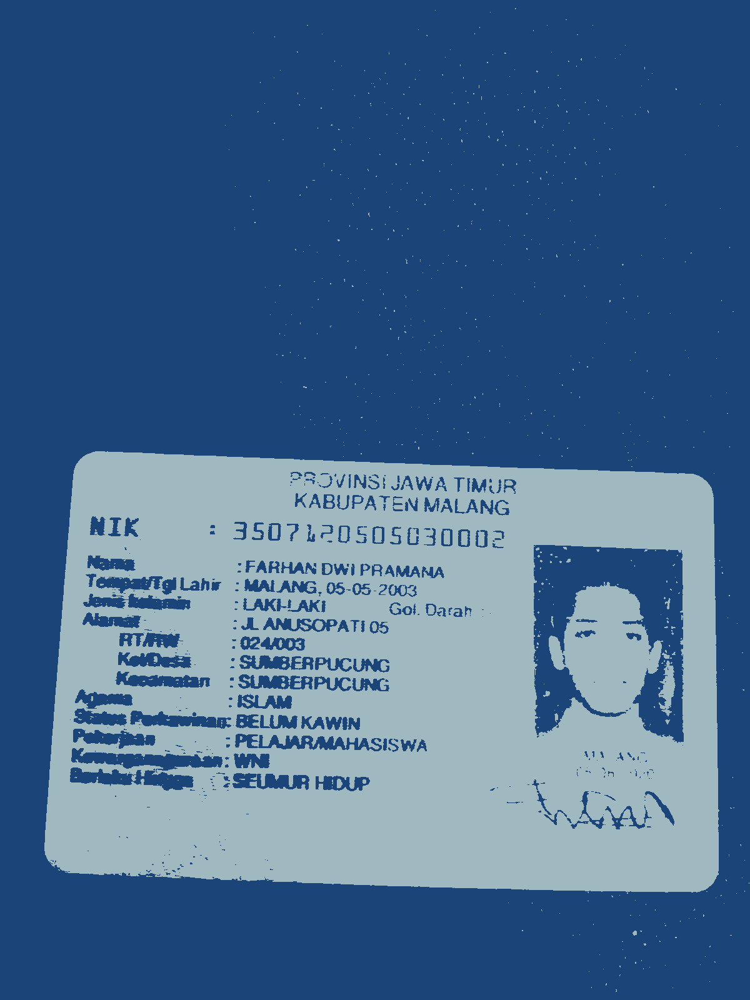

In [98]:
cv2_imshow(clustered_image)

In [99]:
clustered_image.shape

(1600, 1200, 3)

## Grayscale

In [100]:
clustered_image = clustered_image.astype(np.uint8)

# Option 1: Using OpenCV cvtColor
gray = cv2.cvtColor(clustered_image, cv2.COLOR_BGR2GRAY)

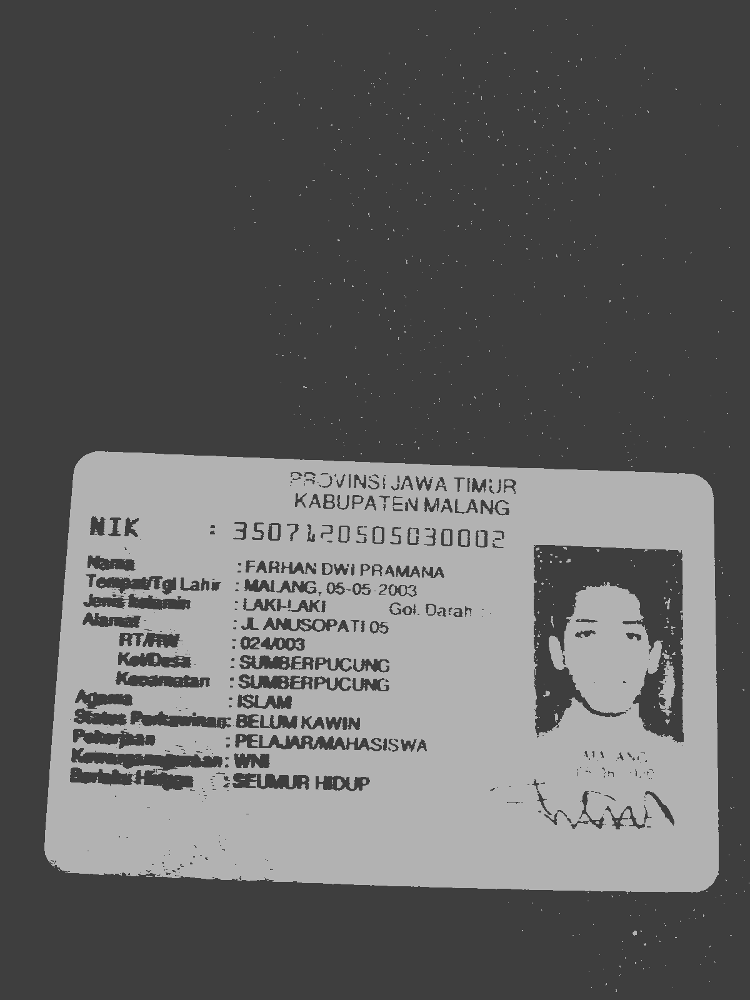

In [101]:
cv2_imshow(gray)

## Contour detection

In [102]:
# Apply thresholding to binarize the image
thresh = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)[1]

contours, hierarchy = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

image_copy_contours = image.copy()

# Draw contours on the original image
cv2.drawContours(image_copy_contours, contours, -1, (0, 255, 0), 2)

array([[[127,  75,  22],
        [126,  74,  21],
        [123,  71,  18],
        ...,
        [143,  87,  28],
        [134,  78,  19],
        [128,  72,  13]],

       [[128,  76,  23],
        [127,  75,  22],
        [124,  72,  19],
        ...,
        [143,  87,  28],
        [135,  79,  20],
        [129,  73,  14]],

       [[130,  78,  25],
        [130,  78,  25],
        [127,  75,  22],
        ...,
        [144,  88,  29],
        [136,  80,  21],
        [131,  75,  16]],

       ...,

       [[ 86,  36,  16],
        [ 88,  38,  18],
        [ 89,  39,  19],
        ...,
        [137,  90,  36],
        [129,  82,  28],
        [123,  76,  22]],

       [[ 86,  36,  16],
        [ 88,  38,  18],
        [ 90,  40,  20],
        ...,
        [134,  87,  33],
        [128,  81,  27],
        [122,  75,  21]],

       [[ 87,  37,  17],
        [ 89,  39,  19],
        [ 90,  40,  20],
        ...,
        [130,  83,  29],
        [125,  78,  24],
        [120,  73,  19]]

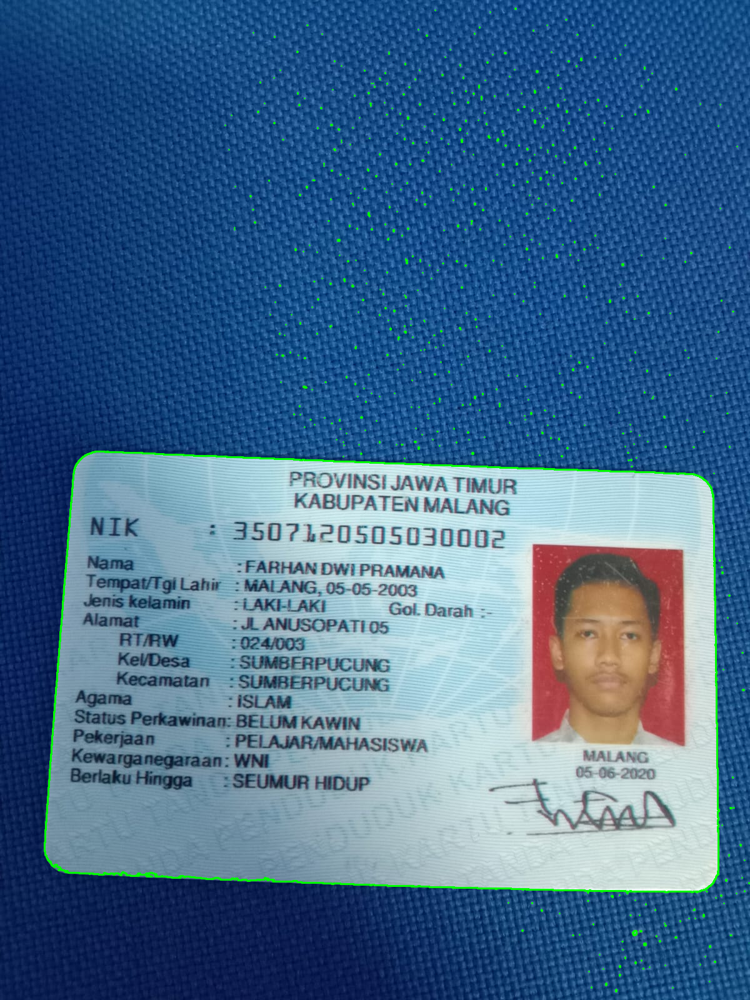

In [103]:
cv2_imshow(image_copy_contours)

## Mencari Contour terbesar

largest_contour_index:0
largest_contour_index:3
largest_contour_index:21
largest_contour_index:30
largest_contour_index:96


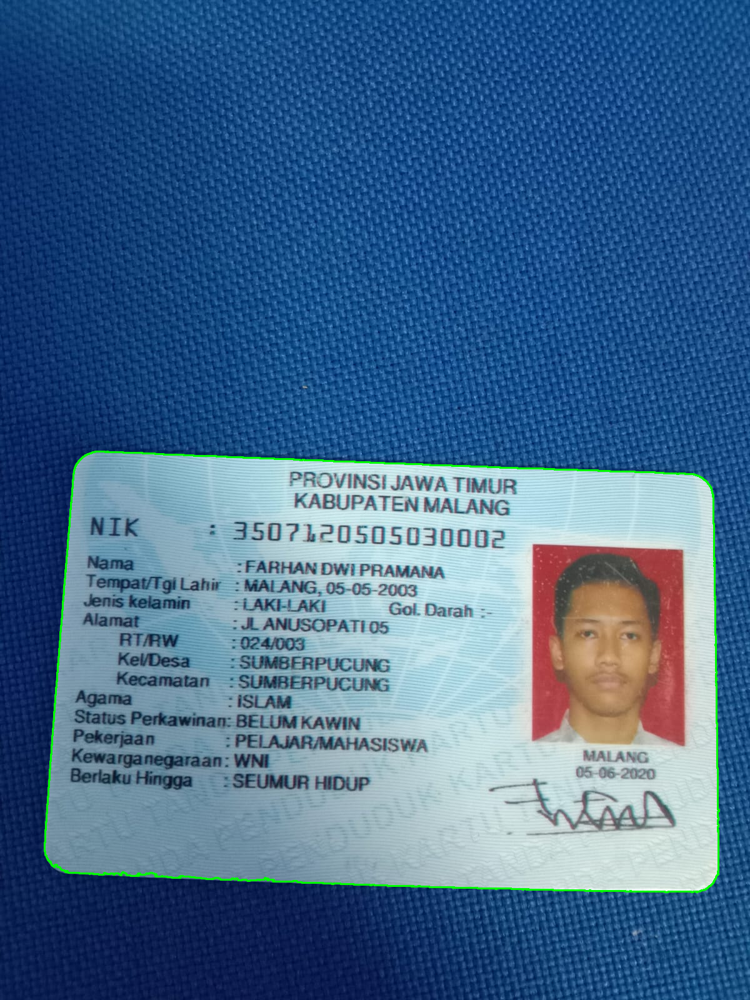

In [104]:
largest_area = 0
largest_contour_index = -1


for i, contour in enumerate(contours):
    area = cv2.contourArea(contour)
    if area > largest_area:
        largest_area = area
        largest_contour_index = i
        print(f"largest_contour_index:{largest_contour_index}")

largest_contour = contours[largest_contour_index]

cv2.drawContours(image, [largest_contour], -1, (0, 255, 0), 2)

cv2_imshow(image)


TODOS:

- pindahkan bagian dalam kontur ke gambar baru
- preprocess
- ocr

In [105]:
def make_outside_black(original_image, largest_contour):
    # Create a mask of the largest contour
    mask = np.zeros_like(original_image)
    cv2.drawContours(mask, [largest_contour], -1, (255, 255, 255), thickness=cv2.FILLED)

    # Make the outside of the contour black
    result_image = np.where(mask != 0, original_image, 0)

    return result_image

In [106]:
black_outside = make_outside_black(image,largest_contour)

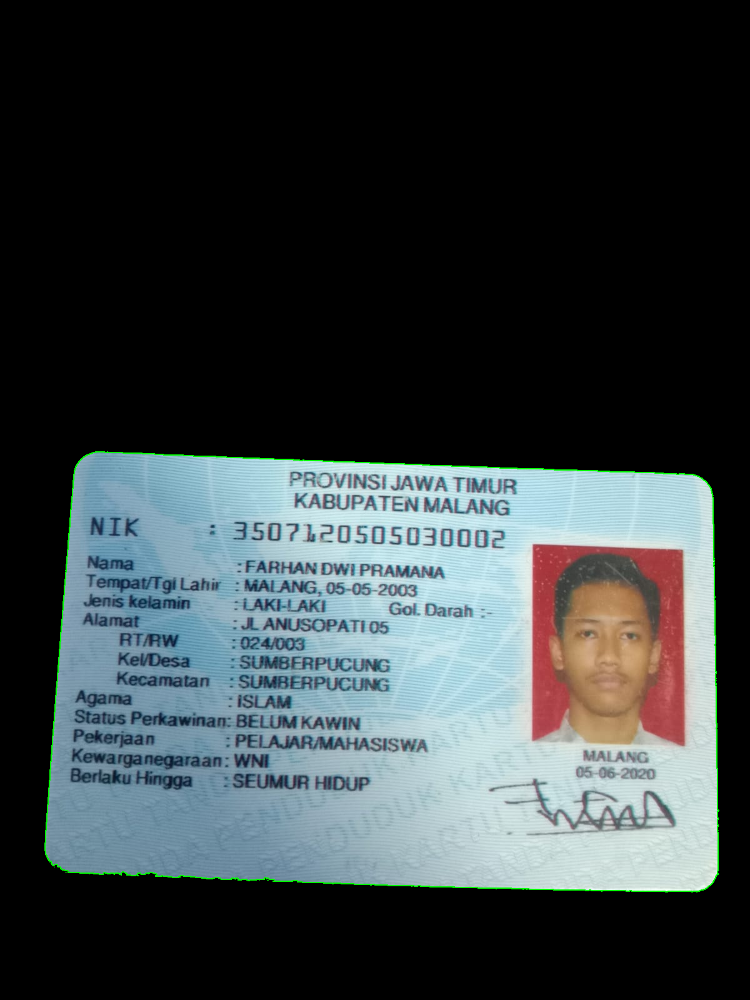

In [107]:
cv2_imshow(black_outside)

## Cropping

In [108]:
# # Get the bounding box of the largest contour
# x, y, w, h = cv2.boundingRect(largest_contour)

# # Extract the largest contour from the original image
# cropped_image = black_outside[y:y + h, x:x + w]

# # Save the cropped image
# cv2_imshow(cropped_image)

## Preprocessing

In [109]:
# def denoise_background(image, ksize=(5, 5), sigmaX=0):
#     # Apply a Gaussian blur to the image
#     blurred_image = cv2.GaussianBlur(image, ksize, sigmaX)

#     return blurred_image

In [110]:
# denoised_image = denoise_background(cropped_image)

# cv2_imshow(denoised_image)

### Straightened

approx [[[ 122  742]]

 [[  87 1387]]

 [[1141 1412]]

 [[1123  764]]]
points [[ 122  742]
 [  87 1387]
 [1141 1412]
 [1123  764]]


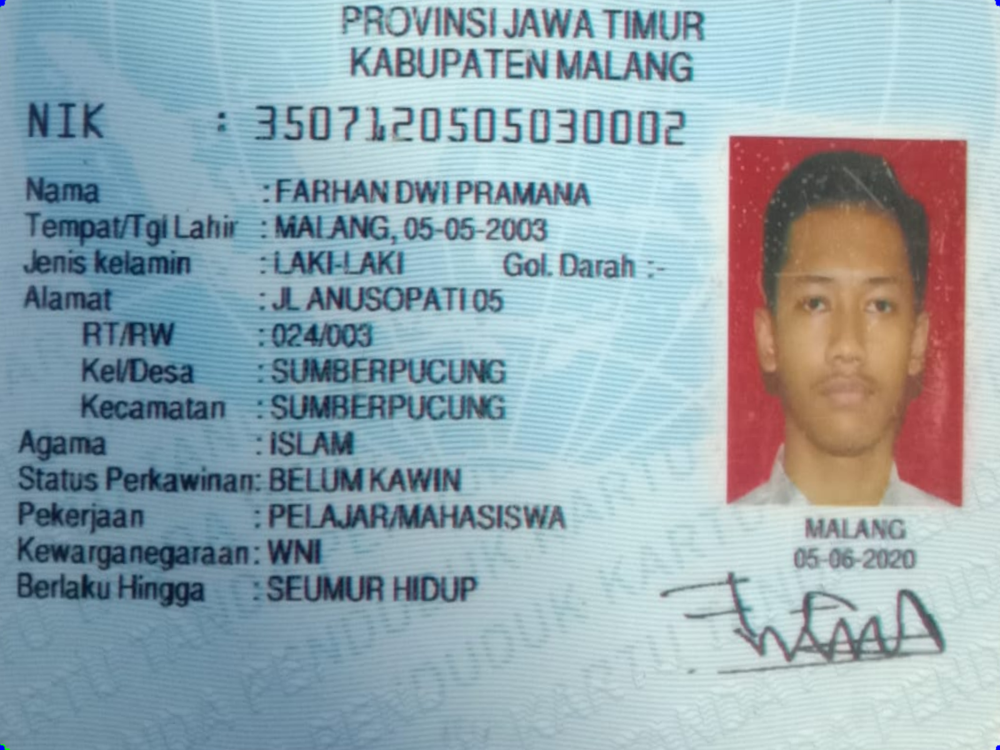

In [111]:
ktp_width, ktp_height = 856, 540

def do_perspective_transformation(rgb, input_array):
    height, width = rgb.shape[:2]
    input_array = np.float32(input_array)
    output_array = np.float32([(0,0), (width, 0), (width, height), (0, height)])
    matrix = cv2.getPerspectiveTransform(input_array, output_array)
    result = cv2.warpPerspective(rgb, matrix, (width, height), cv2.INTER_LINEAR, borderMode=cv2.BORDER_CONSTANT, borderValue=(0,0,0))
    return result

gray = cv2.cvtColor(black_outside, cv2.COLOR_RGB2GRAY)
blur = cv2.medianBlur(gray, 1)
_, thresh = cv2.threshold(blur, 0 , 255, cv2.THRESH_OTSU)
contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
for cnt in contours:
    approx = cv2.approxPolyDP(cnt, 0.01*cv2.arcLength(cnt, True), True)
    area = cv2.contourArea(cnt)
    if len(approx) == 4 and area > 100:
        print('approx', approx)
        points = approx.ravel().reshape(-1, 2)
        print('points', points)
        # Sort points based on x and y coordinates
        sorted_list = sorted(points, key=lambda x: (x[0], x[1]))
        c1, c2, c3, c4 = sorted_list
        cv2.circle(black_outside, tuple(c1), 5, 255, -1)
        cv2.circle(black_outside, tuple(c2), 5, 255, -1)
        cv2.circle(black_outside, tuple(c3), 5, 255, -1)
        cv2.circle(black_outside, tuple(c4), 5, 255, -1)
        input_array = [tuple(c2), tuple(c1), tuple(c4), tuple(c3)]
        transformed_image = do_perspective_transformation(black_outside, input_array)

# jika transformed_image memiliki skala 1.333 artinya gambarnya miring dan terbalik
h,w,_ = transformed_image.shape
scale = h/w


if scale > 1.2 and scale < 1.4:
    # Rotate the image 90 degrees clockwise
    rotated_image = cv2.rotate(transformed_image, cv2.ROTATE_90_CLOCKWISE)

    # Mirror the image horizontally
    mirrored_image = cv2.flip(rotated_image, 1)
    transformed_image = mirrored_image

cv2_imshow(transformed_image)


In [112]:
transformed_image.shape

(1200, 1600, 3)

In [113]:
h,w,_ = transformed_image.shape

ratio = h/w

#TODO: jika ration 1.33333333 maka rotate 90 derajat dan juga mirror

ratio

0.75

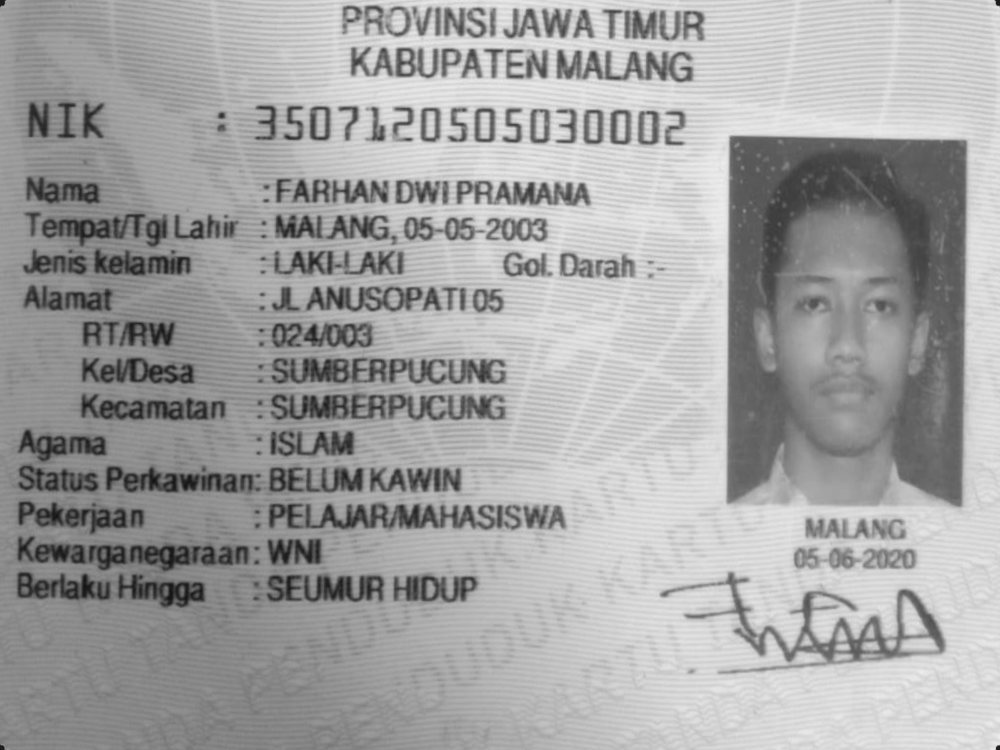

In [114]:
gray = cv2.cvtColor(transformed_image, cv2.COLOR_BGR2GRAY)
# show
cv2_imshow(gray)

### Erode, Otsu

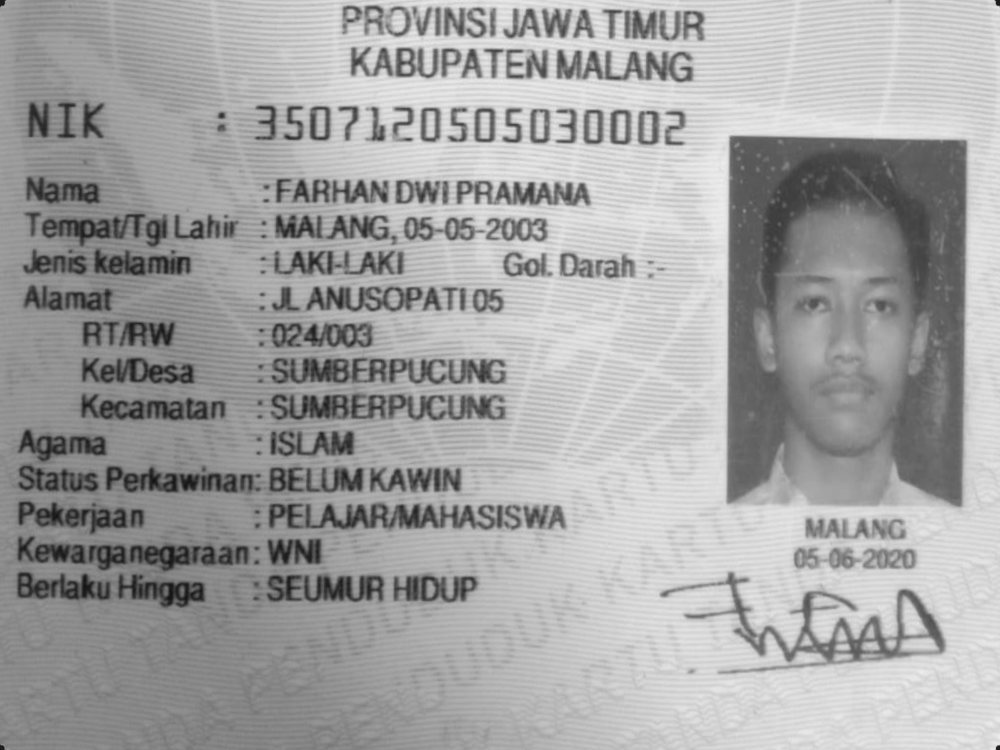

In [115]:
kernel = np.ones((1,1), np.uint8)

dilated_image = cv2.dilate(gray, kernel)

cv2_imshow(dilated_image)

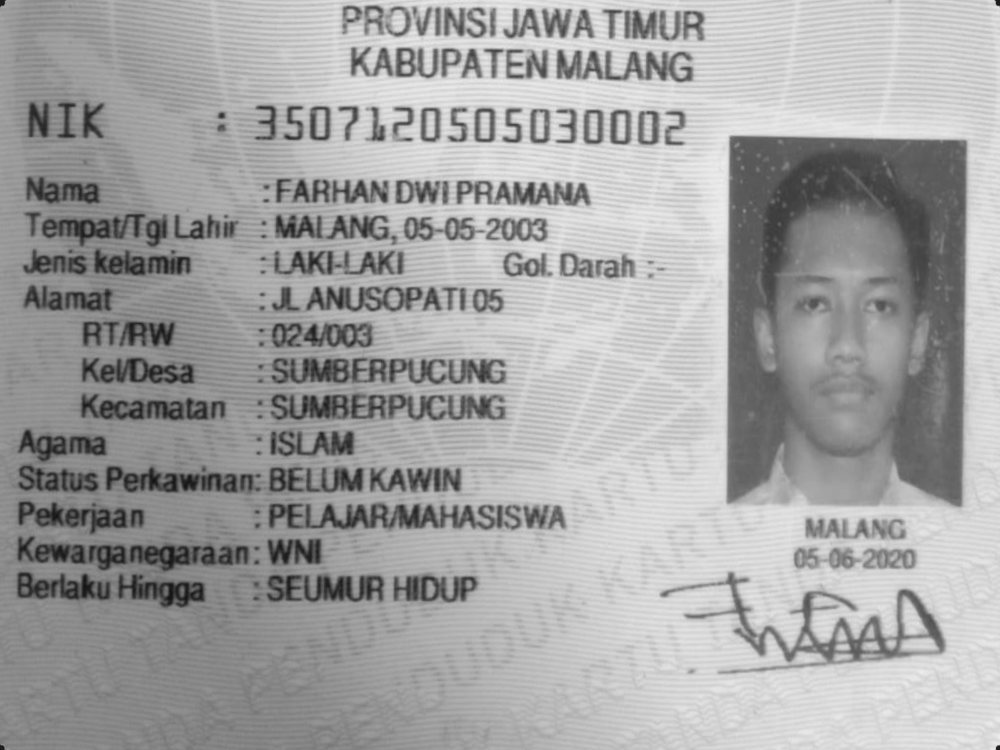

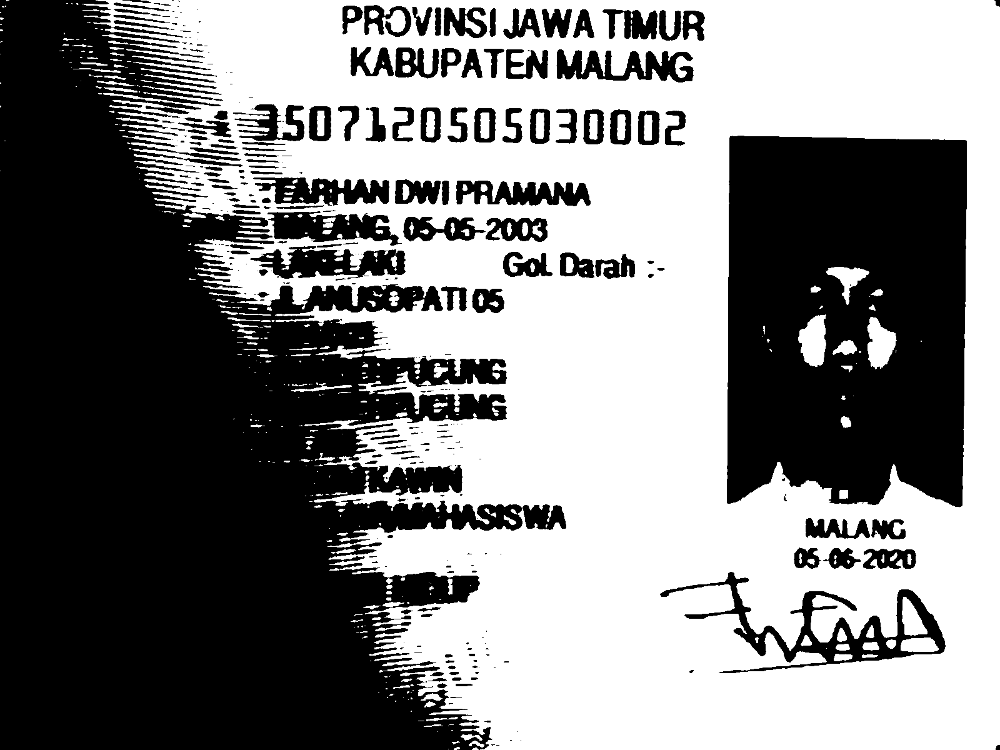

In [116]:

# Test erode
erode = cv2.erode(dilated_image, np.ones((1,1)))
cv2_imshow(erode)

# Test Otsu
_, otsu = cv2.threshold(erode, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
cv2_imshow(otsu)

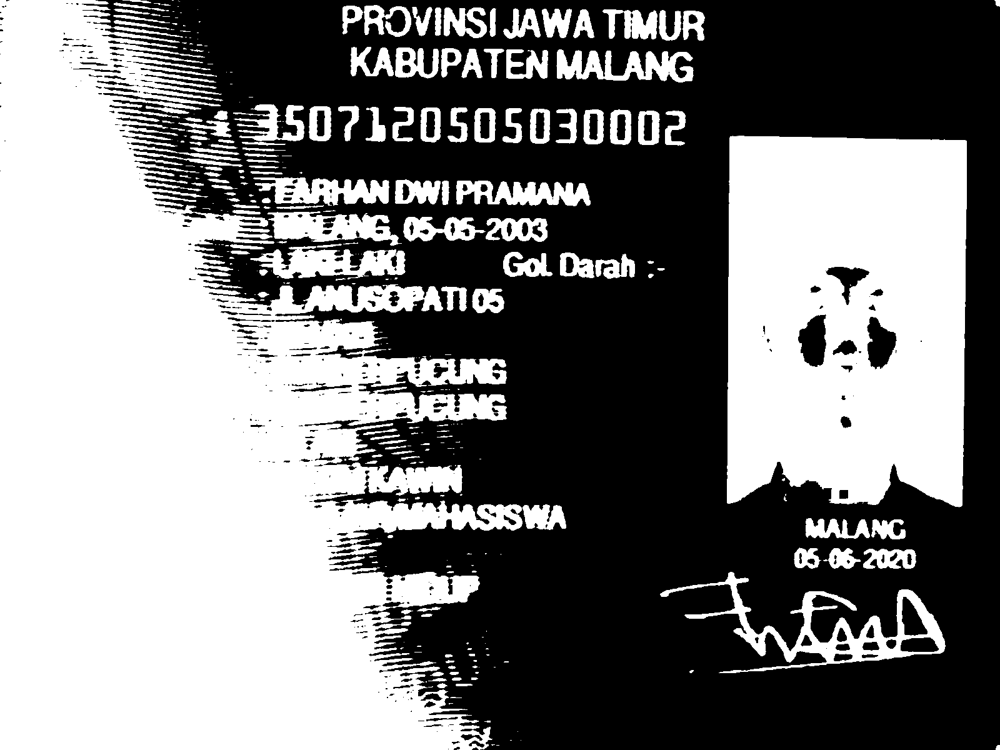

In [117]:
# inverse image since we trained out model
# with black background
invertion = 255 - otsu
# check
cv2_imshow(invertion)

### Mask

In [118]:

# # Compute histogram and probabilities of each intensity level
# histogram = np.histogram(denoised_image, bins=256, range=(0, 256), density=True)[0]
# total_pixels = denoised_image.shape[0] * denoised_image.shape[1]
# probabilities = histogram / total_pixels

# # Initialize variables
# maximum_variance = 0
# optimal_threshold = 0

# # Iterate over all possible threshold values
# for t in range(256):
#     # Calculate weights and means
#     w0 = np.sum(probabilities[:t])
#     w1 = np.sum(probabilities[t:])
#     mean0 = np.sum(np.arange(t) * probabilities[:t]) / w0 if w0 > 0 else 0
#     mean1 = np.sum(np.arange(t, 256) * probabilities[t:]) / w1 if w1 > 0 else 0

#     # Calculate between-class variance
#     variance = w0 * w1 * (mean0 - mean1) ** 2

#     # Update maximum variance and optimal threshold
#     if variance > maximum_variance:
#         maximum_variance = variance
#         optimal_threshold = t

# # Apply thresholding
# thresholded_image = (denoised_image > 100) * 255
# optimal_thresholded_image = (denoised_image > optimal_threshold) * 255

# # Threshold the grayscale image to create a mask.
# threshold = 100
# mask = cv2.threshold(gray, threshold, 255, cv2.THRESH_BINARY_INV)[1]

# cv2_imshow(mask)

## Contour detection

In [119]:
import imutils
from  imutils.contours import sort_contours

In [120]:
# Define function for contour detection
def find_contours(img):
  conts = cv2.findContours(img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
  conts = imutils.grab_contours(conts)
  conts = sort_contours(conts, method='left-to-right')[0]

  return conts

In [121]:
conts = find_contours(invertion.copy())

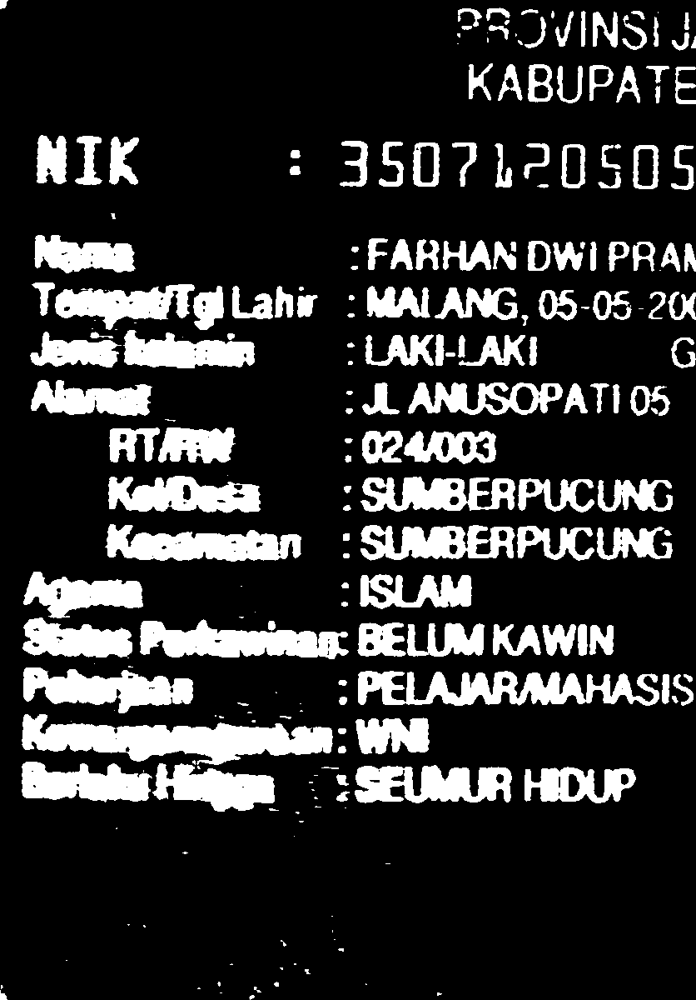

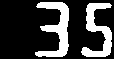

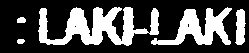

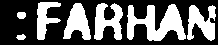

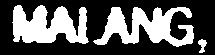

...

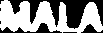

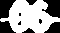

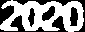

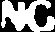

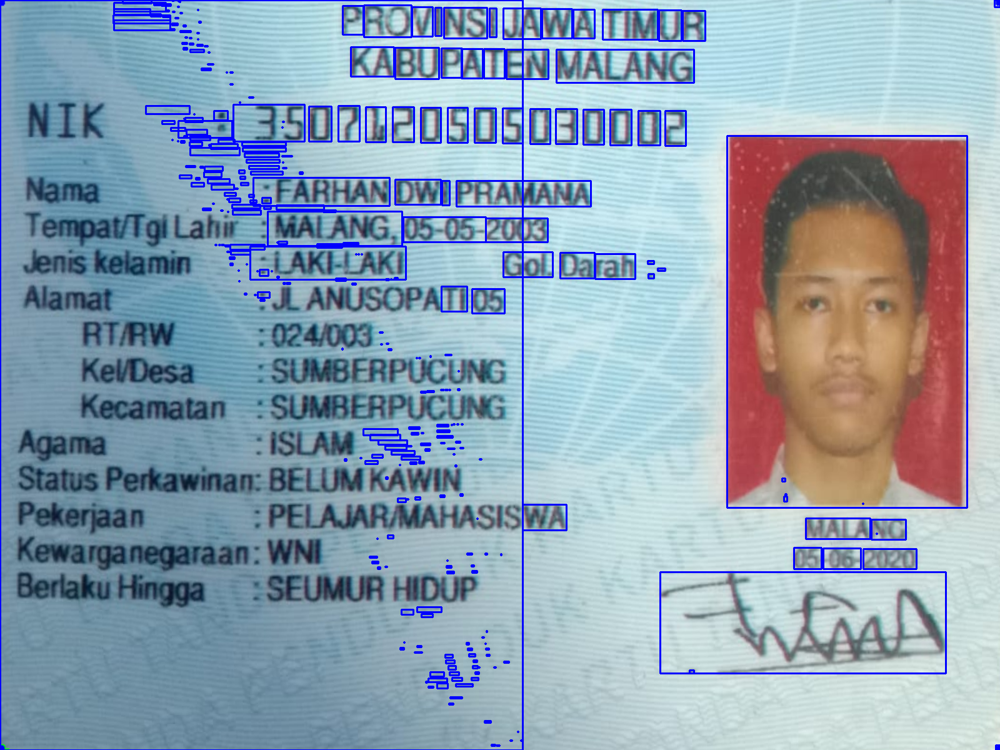

In [122]:

# Get the char based on contour

# Setup min/max width/hight for char
min_w, max_w = 10, 160
min_h, max_h = 14, 140
img_copy = transformed_image.copy() # original image for plotting countour result

for c in conts:
  (x, y, w, h) = cv2.boundingRect(c) # find bounding box based on contour
  # if(w >= min_w and w <= max_w) and (h >= min_h and h <= max_h): # if pixel follow this rule, it consider as char
  roi = gray[y:y+h, x:x+w] # get region of interest for char
  thresh = cv2.threshold(roi, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]
  cv2_imshow(thresh) # check

  # Build bounding box on original image
  cv2.rectangle(img_copy, (x,y), (x+w, y+h), (255,0,0), 2)

# Show bounding box on original image
cv2_imshow(img_copy)

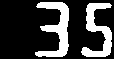

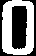

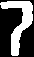

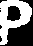

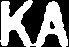

...

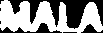

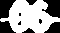

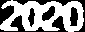

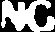

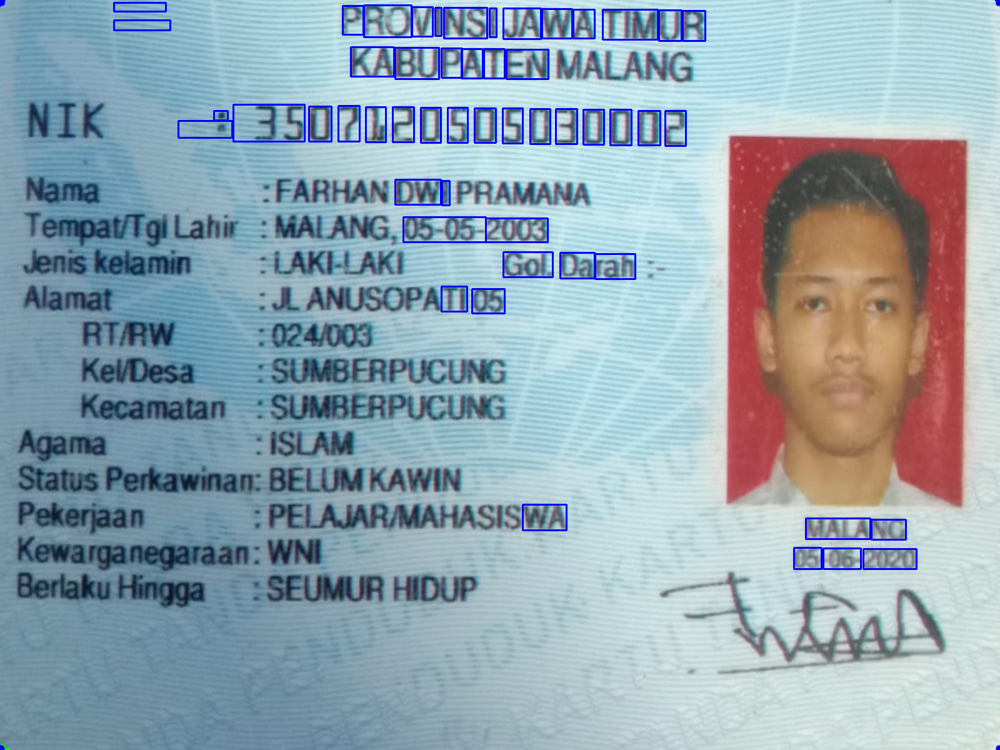

In [123]:

# Get the char based on contour

# Setup min/max width/hight for char
min_w, max_w = 10, 160
min_h, max_h = 14, 140
img_copy = transformed_image.copy()

for c in conts:
  (x, y, w, h) = cv2.boundingRect(c) # find bounding box based on contour
  if(w >= min_w and w <= max_w) and (h >= min_h and h <= max_h): # if pixel follow this rule, it consider as char
    roi = gray[y:y+h, x:x+w] # get region of interest for char
    thresh = cv2.threshold(roi, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]
    cv2_imshow(thresh) # check

    # Build bounding box on original image
    cv2.rectangle(img_copy, (x,y), (x+w, y+h), (255,0,0), 2)

# Show bounding box on original image
cv2_imshow(img_copy)
